## Setting Up Your Python Environment

In [1]:
# %%capture
# # Install PyTorch
# !pip install torch torchvision torchaudio

# # Install additional dependencies
# !pip install matplotlib pandas pillow tqdm

# # Install package for creating visually distinct colormaps
# !pip install distinctipy

# # Install utility packages
# !pip install cjm_psl_utils cjm_pil_utils cjm_pytorch_utils

## Importing the Required Dependencies

In [2]:
# Import Python Standard Library dependencies
from functools import partial
from pathlib import Path
from typing import Any, Dict, Optional, List, Tuple, Union
import random
from functools import singledispatchmethod

# Import utility functions
from cjm_pil_utils.core import get_img_files
from cjm_psl_utils.core import download_file, file_extract
from cjm_pytorch_utils.core import tensor_to_pil

# Import the distinctipy module
from distinctipy import distinctipy

# Import matplotlib for creating plots
import matplotlib.pyplot as plt

# Import numpy
import numpy as np

# Import the pandas package
import pandas as pd

# Do not truncate the contents of cells and display all rows and columns
pd.set_option('max_colwidth', None, 'display.max_rows', None, 'display.max_columns', None)

# Import PIL for image manipulation
from PIL import Image

# Import PyTorch dependencies
import torch
from torch.utils.data import Dataset, DataLoader

# Import torchvision dependencies
import torchvision
torchvision.disable_beta_transforms_warning()
from torchvision.tv_tensors import BoundingBoxes, Mask
from torchvision import tv_tensors
from torchvision.tv_tensors import wrap as tv_wrap
from torchvision.utils import draw_bounding_boxes
import torchvision.transforms.v2 as transforms

# Import tqdm for progress bar
from tqdm.auto import tqdm

## Loading and Exploring the Dataset

### Setting the Directory Paths

In [3]:
# Define path to store datasets
dataset_dir = Path("./Datasets/")
# Create the dataset directory if it does not exist
dataset_dir.mkdir(parents=True, exist_ok=True)

# Define path to store archive files
archive_dir = dataset_dir/'../Archive'
# Create the archive directory if it does not exist
archive_dir.mkdir(parents=True, exist_ok=True)

# Creating a Series with the paths and converting it to a DataFrame for display
pd.Series({
    "Dataset Directory:": dataset_dir, 
    "Archive Directory:": archive_dir
}).to_frame().style.hide(axis='columns')

Dataset Directory:,Datasets
Archive Directory:,Datasets/../Archive


### Setting the Dataset Path

In [4]:
# Set the name of the dataset
dataset_name = 'labelme-bounding-box-toy-dataset'

# Construct the HuggingFace Hub dataset name by combining the username and dataset name
hf_dataset = f'cj-mills/{dataset_name}'

# Create the path to the zip file that contains the dataset
archive_path = Path(f'{archive_dir}/{dataset_name}.zip')

# Create the path to the directory where the dataset will be extracted
dataset_path = Path(f'{dataset_dir}/{dataset_name}')

# Creating a Series with the dataset name and paths and converting it to a DataFrame for display
pd.Series({
    "HuggingFace Dataset:": hf_dataset, 
    "Archive Path:": archive_path, 
    "Dataset Path:": dataset_path
}).to_frame().style.hide(axis='columns')

HuggingFace Dataset:,cj-mills/labelme-bounding-box-toy-dataset
Archive Path:,Datasets/../Archive/labelme-bounding-box-toy-dataset.zip
Dataset Path:,Datasets/labelme-bounding-box-toy-dataset


### Downloading the Dataset

In [5]:
# Construct the HuggingFace Hub dataset URL
dataset_url = f"https://huggingface.co/datasets/{hf_dataset}/resolve/main/{dataset_name}.zip"
print(f"HuggingFace Dataset URL: {dataset_url}")

# Set whether to delete the archive file after extracting the dataset
delete_archive = True

# Download the dataset if not present
if dataset_path.is_dir():
    print("Dataset folder already exists")
else:
    print("Downloading dataset...")
    download_file(dataset_url, archive_dir)    
    
    print("Extracting dataset...")
    file_extract(fname=archive_path, dest=dataset_dir)
    
    # Delete the archive if specified
    if delete_archive: archive_path.unlink()

HuggingFace Dataset URL: https://huggingface.co/datasets/cj-mills/labelme-bounding-box-toy-dataset/resolve/main/labelme-bounding-box-toy-dataset.zip
Dataset folder already exists


### Get Image File Paths

In [6]:
# Get a list of image files in the dataset
img_file_paths = get_img_files(dataset_path)

# Create a dictionary that maps file names to file paths
img_dict = {file.stem : file for file in (img_file_paths)}

# Print the number of image files
print(f"Number of Images: {len(img_dict)}")

# Display the first five entries from the dictionary using a Pandas DataFrame
pd.DataFrame.from_dict(img_dict, orient='index').head()

Number of Images: 29


,0
258421,Datasets/labelme-bounding-box-toy-dataset/258421.jpg
3075367,Datasets/labelme-bounding-box-toy-dataset/3075367.jpg
3076319,Datasets/labelme-bounding-box-toy-dataset/3076319.jpg
3145551,Datasets/labelme-bounding-box-toy-dataset/3145551.jpg
3176048,Datasets/labelme-bounding-box-toy-dataset/3176048.jpg


### Get Image Annotations

In [7]:
# Get a list of JSON files in the dataset
annotation_file_paths = list(dataset_path.glob('*.json'))

# Create a generator that yields Pandas DataFrames containing the data from each JSON file
cls_dataframes = (pd.read_json(f, orient='index').transpose() for f in tqdm(annotation_file_paths))

# Concatenate the DataFrames into a single DataFrame
annotation_df = pd.concat(cls_dataframes, ignore_index=False)

# Assign the image file name as the index for each row
annotation_df['index'] = annotation_df.apply(lambda row: row['imagePath'].split('.')[0], axis=1)
annotation_df = annotation_df.set_index('index')

# Keep only the rows that correspond to the filenames in the 'img_dict' dictionary
annotation_df = annotation_df.loc[list(img_dict.keys())]

# Print the first 5 rows of the DataFrame
annotation_df.head()

  0%|          | 0/29 [00:00<?, ?it/s]

,version,flags,shapes,imagePath,imageData,imageHeight,imageWidth
index,,,,,,,
258421,5.3.1,{},"[{'label': 'person', 'points': [[340.2519836425781, 466.943359375], [418.9939880371094, 777.34423828125]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}, {'label': 'person', 'points': [[386.076124567474, 443.94463667820065], [460.81660899653974, 777.1626297577855]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}]",258421.jpg,None,1152,768
3075367,5.3.1,{},"[{'label': 'person', 'points': [[413.31866455078125, 41.2171630859375], [919.8128051757812, 763.16552734375]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}]",3075367.jpg,None,768,1344
3076319,5.3.1,{},"[{'label': 'person', 'points': [[335.30731201171875, 151.749755859375], [711.2194213867188, 1117.489013671875]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}, {'label': 'person', 'points': [[8.10714285714289, 131.87500000000003], [404.2032880329769, 1119.0]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}]",3076319.jpg,None,1120,768
3145551,5.3.1,{},"[{'label': 'person', 'points': [[658.6324462890625, 281.2455139160156], [687.085693359375, 398.6059265136719]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}, {'label': 'person', 'points': [[642.0, 289.8510638297872], [669.6595744680851, 398.8936170212766]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}]",3145551.jpg,None,768,1184
3176048,5.3.1,{},"[{'label': 'person', 'points': [[518.2313232421875, 338.9653015136719], [594.632080078125, 466.0799865722656]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}, {'label': 'person', 'points': [[683.419689119171, 356.47668393782385], [638.860103626943, 437.8238341968912]], 'group_id': None, 'description': '', 'shape_type': 'rectangle', 'flags': {}}]",3176048.jpg,None,768,1152


### Visualizing Image Annotations

#### Get image classes

In [8]:
# Explode the 'shapes' column in the annotation_df dataframe
# Convert the resulting series to a dataframe and rename the 'shapes' column to 'shapes'
# Apply the pandas Series function to the 'shapes' column of the dataframe
shapes_df = annotation_df['shapes'].explode().to_frame().shapes.apply(pd.Series)

# Get a list of unique labels in the 'annotation_df' DataFrame
class_names = shapes_df['label'].unique().tolist()

# Display labels using a Pandas DataFrame
pd.DataFrame(class_names)

,0
0,person
1,NaN


#### Generate a color map

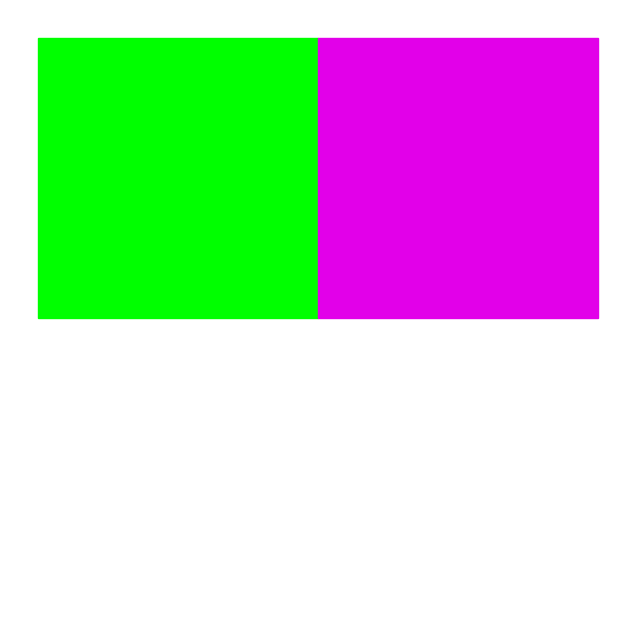

In [9]:
# Generate a list of colors with a length equal to the number of labels
colors = distinctipy.get_colors(len(class_names))

# Make a copy of the color map in integer format
int_colors = [tuple(int(c*255) for c in color) for color in colors]

# Generate a color swatch to visualize the color map
distinctipy.color_swatch(colors)

#### Download a font file

In [10]:
# Set the name of the font file
font_file = 'KFOlCnqEu92Fr1MmEU9vAw.ttf'

# Download the font file
download_file(f"https://fonts.gstatic.com/s/roboto/v30/{font_file}", "./")

The file ./KFOlCnqEu92Fr1MmEU9vAw.ttf already exists and overwrite is set to False.


#### Define the bounding box annotation function

In [11]:
draw_bboxes = partial(draw_bounding_boxes, fill=False, width=2, font=font_file, font_size=25)

#### Define function that ensures bounding boxes are in a consistent format

In [12]:
def correct_bounding_boxes(bboxes):
    # Ensure input is a NumPy array
    bboxes = np.asarray(bboxes)
    
    # Correct x coordinates
    # Swap the x coordinates if the top-left x is greater than the bottom-right x
    x_min = np.minimum(bboxes[:, 0], bboxes[:, 2])
    x_max = np.maximum(bboxes[:, 0], bboxes[:, 2])
    
    # Correct y coordinates
    # Swap the y coordinates if the top-left y is greater than the bottom-right y
    y_min = np.minimum(bboxes[:, 1], bboxes[:, 3])
    y_max = np.maximum(bboxes[:, 1], bboxes[:, 3])
    
    # Construct the corrected bounding boxes array
    corrected_bboxes = np.stack([x_min, y_min, x_max, y_max], axis=1)
    
    return corrected_bboxes

#### Annotate a sample image

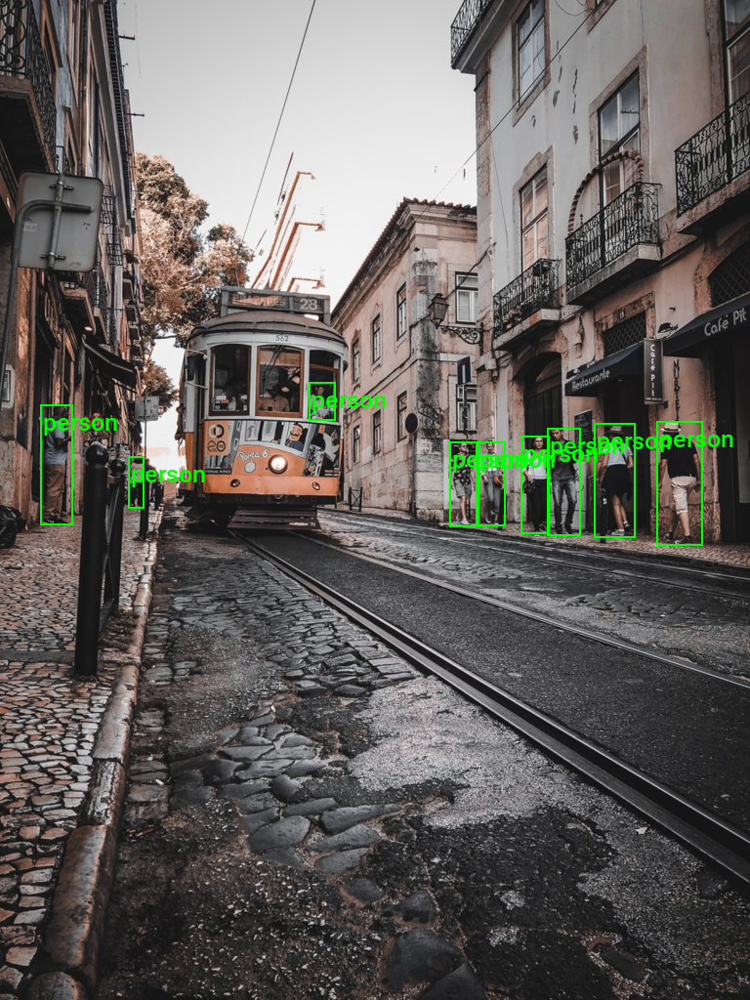

In [13]:
# Get the file ID of the first image file
file_id = list(img_dict.keys())[19]

# Open the associated image file as a RGB image
sample_img = Image.open(img_dict[file_id]).convert('RGB')

# Extract the labels and bounding box annotations for the sample image
labels = [shape['label'] for shape in annotation_df.loc[file_id]['shapes']]
bboxes = np.array([shape['points'] for shape in annotation_df.loc[file_id]['shapes']], dtype=np.float32).reshape(len(labels),4)

# Ensure bounding boxes are in [top-left x,top-left y,bottom-right x,bottom-right y] format
bboxes = correct_bounding_boxes(bboxes)

# Annotate the sample image with labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=transforms.PILToTensor()(sample_img), 
    boxes=BoundingBoxes(torchvision.ops.box_convert(torch.Tensor(bboxes), 'xyxy', 'xyxy'), format='xyxy', canvas_size=sample_img.size[::-1]),
    labels=labels, 
    colors=[int_colors[i] for i in [class_names.index(label) for label in labels]]
)

tensor_to_pil(annotated_tensor)

## Creating a Random Pixel Copy Transform

### Define the Custom Transform Class

In [14]:
class RandomPixelCopy(transforms.Transform):
    """
    A torchvision V2 transform that copies data from a randomly selected set of pixels to another 
    randomly selected set of pixels of a image tensor.
    """
    def __init__(self,
                 min_pct=0.0025, # The minimum percentage of the tensor's pixels to be copied.
                 max_pct:float=0.1 # The maximum percentage of the tensor's pixels to be copied.
                ):
        
        super().__init__()
        self.min_pct = min_pct
        self.max_pct = max_pct

    def rand_pixel_copy(self, 
                        img_tensor:torch.Tensor, # The input image tensor.
                        pct:float # The percentage of the total number of pixels to be selected as the source and target sets of pixels.
                       ) -> torch.Tensor : # The modified input image tensor.
        """
        Copy data from a randomly selected set of pixels to another randomly selected set of pixels of a image tensor.
        """
        
        src_dim = img_tensor.dim()
        
        img_tensor = img_tensor.unsqueeze(0) if src_dim == 3 else img_tensor
        
        # Get the shape of the img_tensor
        b, c, h, w = img_tensor.shape
        
        # Calculate the number of pixels to be selected
        num_pixels = int(img_tensor[-1:].numel() * pct)
        
        # Select the source pixel indices
        source_indices = torch.LongTensor(num_pixels, 2).random_(0, h * w)
        source_indices[:, 0] = source_indices[:, 0] // w
        source_indices[:, 1] = source_indices[:, 1] % w
        
        # Select the target pixel indices
        target_indices = torch.LongTensor(num_pixels, 2).random_(0, h * w)
        target_indices[:, 0] = target_indices[:, 0] // w
        target_indices[:, 1] = target_indices[:, 1] % w
        
        # Get the indices of the channels
        c_indices = torch.arange(c).repeat(num_pixels, 1).t()
        
        # Copy the pixels
        source_pixels = img_tensor[:, c_indices, source_indices[:, 0], source_indices[:, 1]]
        img_tensor[:, c_indices, target_indices[:, 0], target_indices[:, 1]] = source_pixels
        
        return img_tensor.squeeze(0) if src_dim == 3 else img_tensor

    @singledispatchmethod
    def transform(self, inpt: Any, params: Dict[str, Any]) -> Any:
        """Default Behavior: Don't modify the input"""
        return inpt

    @transform.register(torch.Tensor)
    @transform.register(tv_tensors.Image)
    def _(self, inpt: Union[torch.Tensor, tv_tensors.Image], params: Dict[str, Any]) -> Any:
        """Apply the `rand_pixel_copy` method to the input tensor"""
        return self.rand_pixel_copy(inpt, max(self.min_pct, random.random() * self.max_pct))

    @transform.register(Image.Image)
    def _(self, inpt: Image.Image, params: Dict[str, Any]) -> Any:
        """Convert the PIL Image to a torch.Tensor to apply the transform"""
        inpt_torch = transforms.PILToTensor()(inpt)
        return transforms.ToPILImage()(self.transform(inpt_torch, params))

    @transform.register(BoundingBoxes)
    @transform.register(Mask)
    def _(self, inpt: Union[BoundingBoxes, Mask], params: Dict[str, Any]) -> Any:
        """Don't modify image annotations"""
        return inpt

### Initialize the Transform

In [15]:
# Create a RandomPixelCopy object
rand_pixel_copy_tfm = RandomPixelCopy(max_pct=0.05)

### Prepare the Annotation Targets

In [16]:
# Prepare bounding box targets
targets = {
    'boxes': BoundingBoxes(torch.Tensor(bboxes), 
                           format='xyxy', 
                           canvas_size=sample_img.size[::-1]), 
    'labels': torch.Tensor([class_names.index(label) for label in labels])
}

### Apply the Augmentation

#### PIL.Image

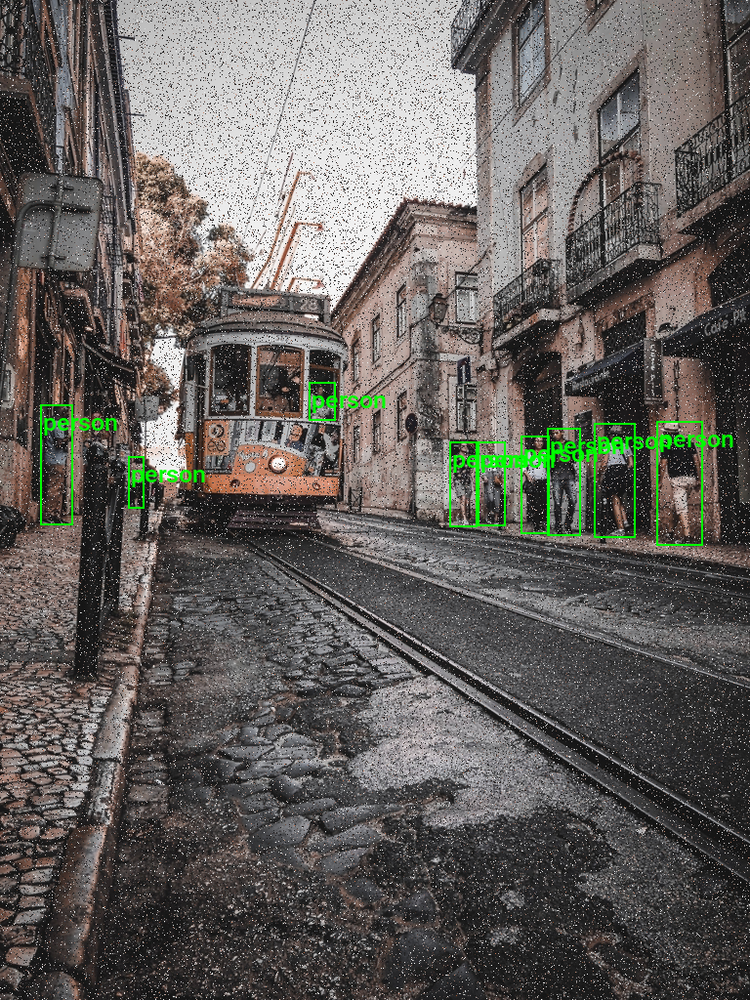

In [17]:
# Feed sample image and targets through the image transform
augmented_img, augmented_targets = rand_pixel_copy_tfm(sample_img, targets)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=transforms.PILToTensor()(augmented_img), 
    boxes=augmented_targets['boxes'], 
    labels=[class_names[int(label.item())] for label in augmented_targets['labels']], 
    colors=[int_colors[int(i)] for i in augmented_targets['labels']]
)

# Display the augmented image
transforms.ToPILImage()(annotated_tensor)

#### torch.Tensor

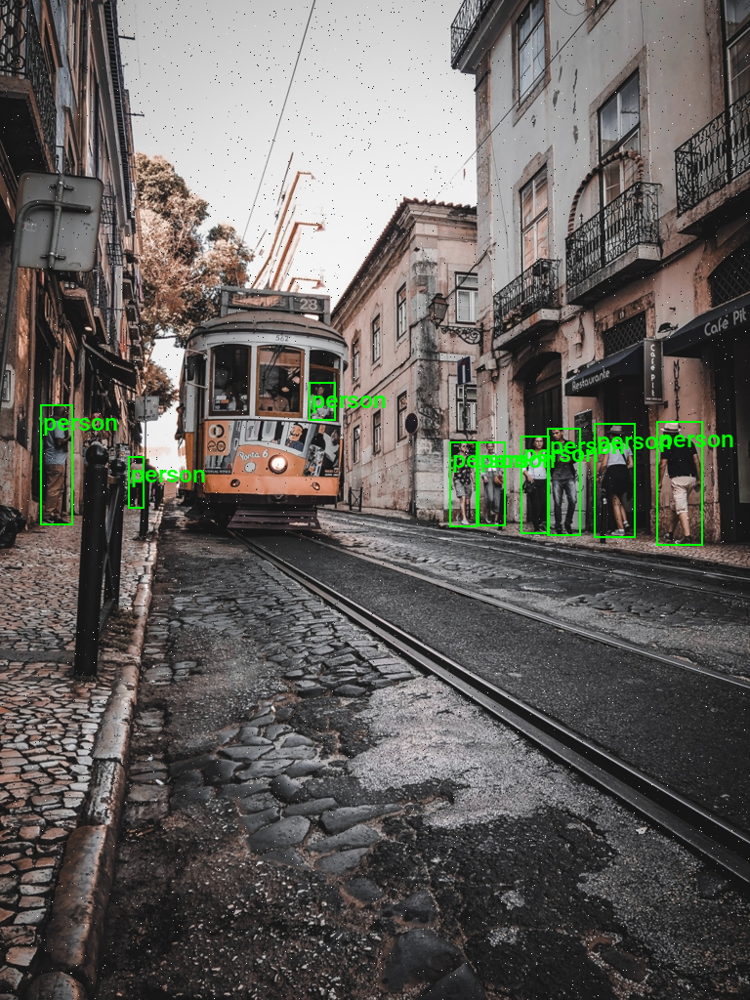

In [18]:
# Feed sample image and targets through the image transform
augmented_img, augmented_targets = rand_pixel_copy_tfm(transforms.PILToTensor()(sample_img), targets)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=augmented_img, 
    boxes=augmented_targets['boxes'], 
    labels=[class_names[int(label.item())] for label in augmented_targets['labels']], 
    colors=[int_colors[int(i)] for i in augmented_targets['labels']]
)

# Display the augmented image
transforms.ToPILImage()(annotated_tensor)

#### tv_tensor.Image

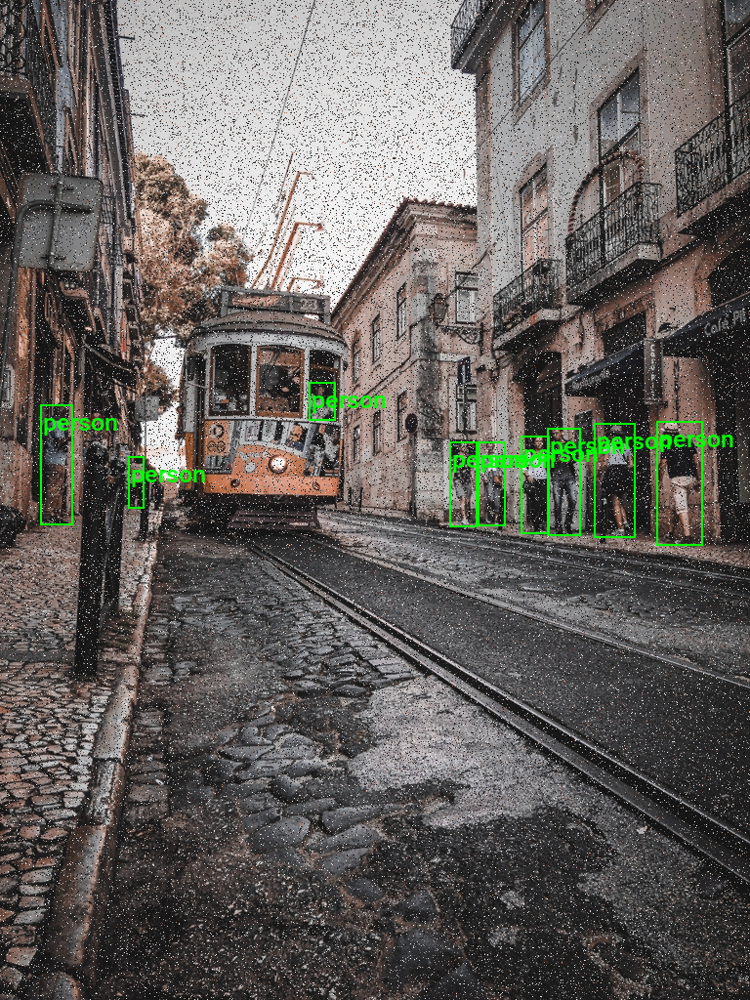

In [19]:
# Feed sample image and targets through the image transform
augmented_img, augmented_targets = rand_pixel_copy_tfm(transforms.ToImage()(sample_img), targets)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=augmented_img, 
    boxes=augmented_targets['boxes'], 
    labels=[class_names[int(label.item())] for label in augmented_targets['labels']], 
    colors=[int_colors[int(i)] for i in augmented_targets['labels']]
)

# Display the augmented image
transforms.ToPILImage()(annotated_tensor)

## Creating a Random Patch Copy Transform

### Define the Custom Transform Class

In [20]:
class RandomPatchCopy(transforms.Transform):
    """
    A torchvision V2 transform that copies data from a randomly selected rectangular patch
    to another randomly selected rectangular region of an image tensor multiple times.
    """
    def __init__(self, 
                 pct:float=0.2, # The percentage of the tensor's size to be used as the side length of the square regions.
                 min_num:int=0, # The minimum number of times to apply the `rand_square_copy` function.
                 max_num:int=4, # The maximum number of times to apply the `rand_square_copy` function.
                 iou_thresh:float=0.25 # The IoU threshold for bounding box suppression.
                ):
        
        super().__init__()
        self.pct = pct
        self.min_num = min_num
        self.max_num = max_num
        self.iou_thresh = iou_thresh
        self.patches = []


    def calculate_iou_multi(self,
                            boxes1:torch.Tensor, # An array of bounding boxes in [x1, y1, x2, y2] format.
                            boxes2:torch.Tensor # Another array of bounding boxes in [x1, y1, x2, y2] format.
                           ) -> torch.Tensor: # A 2D array where element (i, j) is the IoU of boxes1[i] and boxes2[j].
        """
        Calculate the Intersection over Union (IoU) for each combination of bounding boxes in two arrays
        using PyTorch broadcasting.
        """
        # Expand boxes1 and boxes2 for broadcasting
        boxes1 = boxes1[:, None, :]
        boxes2 = boxes2[None, :, :]
    
        # Calculate intersection coordinates
        int_x1 = torch.max(boxes1[..., 0], boxes2[..., 0])
        int_y1 = torch.max(boxes1[..., 1], boxes2[..., 1])
        int_x2 = torch.min(boxes1[..., 2], boxes2[..., 2])
        int_y2 = torch.min(boxes1[..., 3], boxes2[..., 3])
    
        # Calculate intersection and union areas
        int_area = torch.clamp(int_x2 - int_x1, min=0) * torch.clamp(int_y2 - int_y1, min=0)
        box1_area = (boxes1[..., 2] - boxes1[..., 0]) * (boxes1[..., 3] - boxes1[..., 1])
        box2_area = (boxes2[..., 2] - boxes2[..., 0]) * (boxes2[..., 3] - boxes2[..., 1])
        union_area = box1_area + box2_area - int_area
    
        # Calculate IoU
        iou = int_area / torch.clamp(union_area, min=1e-10)
    
        return iou
    

    def rand_patch_copy(self, 
                        img_tensor:torch.Tensor, # The input image tensor.
                        pct:float # # The percentage of the image tensor's size to be used as the side length of the patch.
                       ) -> (torch.Tensor, tuple): # The modified input image tensor and coordinates of the target patch in the format [x, y, w, h].
        """
        Copy data from a randomly selected rectangular patch to another randomly selected 
        rectangular region of an image tensor, and return the coordinates of the target patch.
        Assumes the tensor is in 'channels-first' format.
        """
        if not (0 < pct <= 1):
            raise ValueError("pct must be between 0 and 1")
    
        # Get the shape of the tensor
        _, h, w = img_tensor.shape
    
        # Calculate the size of the rectangle
        szx = int(pct * w)
        szy = int(pct * h)
    
        # Calculate the top-left coordinate of the source rectangle
        sty1 = random.randint(0, w - szx)  # x-coordinate
        stx1 = random.randint(0, h - szy)  # y-coordinate
    
        # Calculate the top-left coordinate of the target rectangle
        sty2 = random.randint(0, w - szx)  # x-coordinate
        stx2 = random.randint(0, h - szy)  # y-coordinate
    
        # Copy the data from the source square to the target rectangle
        img_tensor[:, stx2:stx2 + szy, sty2:sty2 + szx] = img_tensor[:, stx1:stx1 + szy, sty1:sty1 + szx]
    
        # The coordinates of the target patch
        target_patch_coords = [sty2, stx2, sty2 + szx, stx2 + szy]
    
        return img_tensor, target_patch_coords


    @singledispatchmethod
    def transform(self, inpt: Any, params: Dict[str, Any]) -> Any:
        """Default Behavior: Don't modify the input"""
        return inpt

    @transform.register(torch.Tensor)
    @transform.register(tv_tensors.Image)
    def _(self, inpt: Union[torch.Tensor, tv_tensors.Image], params: Dict[str, Any]) -> Any:
        self.patches = []
        """Apply the `rand_square_copy` function to the input tensor multiple times"""
        for i in range(random.randint(self.min_num, self.max_num)):
            inpt, patch = self.rand_patch_copy(inpt, max(0.1,random.random()*self.pct))
            self.patches.append(patch)
        return inpt

    @transform.register(Image.Image)
    def _(self, inpt: Image.Image, params: Dict[str, Any]) -> Any:
        """Convert the PIL Image to a torch.Tensor to apply the transform"""
        inpt_torch = transforms.PILToTensor()(inpt)    
        return transforms.ToPILImage()(self.transform(inpt_torch, params))
    
    @transform.register(BoundingBoxes)
    def _(self, inpt: BoundingBoxes, params: Dict[str, Any]) -> Any:
        """Update the bounding box annotations based on the list of patches"""
        if len(self.patches) > 0:
            iou_matrix = self.calculate_iou_multi(inpt, torch.tensor(self.patches, dtype=torch.float32))
            
            # Sum the IoU values for each box in boxes1
            cumulative_iou = torch.sum(iou_matrix, axis=1)
            # Create a mask based on the cumulative IoU threshold
            mask = cumulative_iou > self.iou_thresh
            inpt_copy = torch.clone(inpt)
            inpt_copy[mask] = 0
            return tv_wrap(inpt_copy, like=inpt)
        return inpt

    @transform.register(Mask)
    def _(self, inpt: Mask, params: Dict[str, Any]) -> Any:
        """Don't modify segmentation annotations"""
        return inpt

### Initialize the Transform

In [21]:
# Create a RandomPatchCopy object
rand_patch_copy_tfm = RandomPatchCopy(pct=0.3, min_num=1, max_num=4)

### Prepare the Annotation Targets

In [22]:
# Prepare bounding box targets
targets = {
    'boxes': BoundingBoxes(torch.Tensor(bboxes), 
                           format='xyxy', 
                           canvas_size=sample_img.size[::-1]), 
    'labels': torch.Tensor([class_names.index(label) for label in labels])
}

### Apply the Augmentation

#### PIL.Image

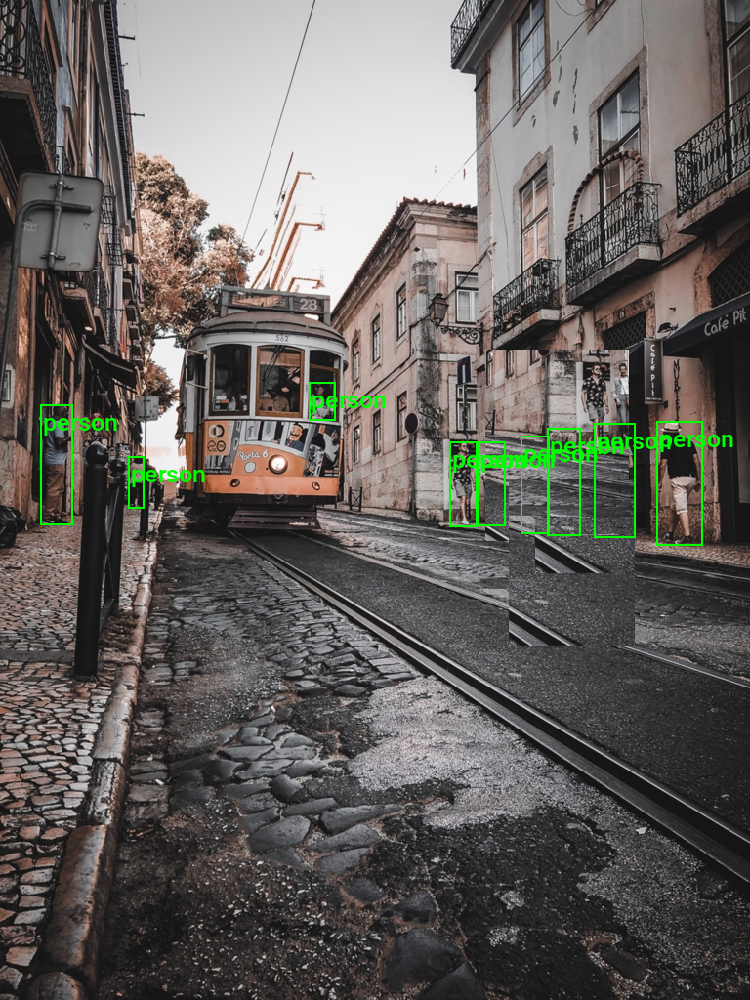

In [23]:
# Feed sample image and targets through the image transform
augmented_img, augmented_targets = rand_patch_copy_tfm(sample_img, targets)
# Remove degenerate/invalid bounding boxes and their corresponding labels and masks.
sanitized_img, sanitized_targets = transforms.SanitizeBoundingBoxes()(augmented_img, augmented_targets)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=transforms.PILToTensor()(sanitized_img), 
    boxes=sanitized_targets['boxes'], 
    labels=[class_names[int(label.item())] for label in sanitized_targets['labels']], 
    colors=[int_colors[int(i)] for i in sanitized_targets['labels']]
)

# Display the augmented image
tensor_to_pil(annotated_tensor)

#### torch.Tensor

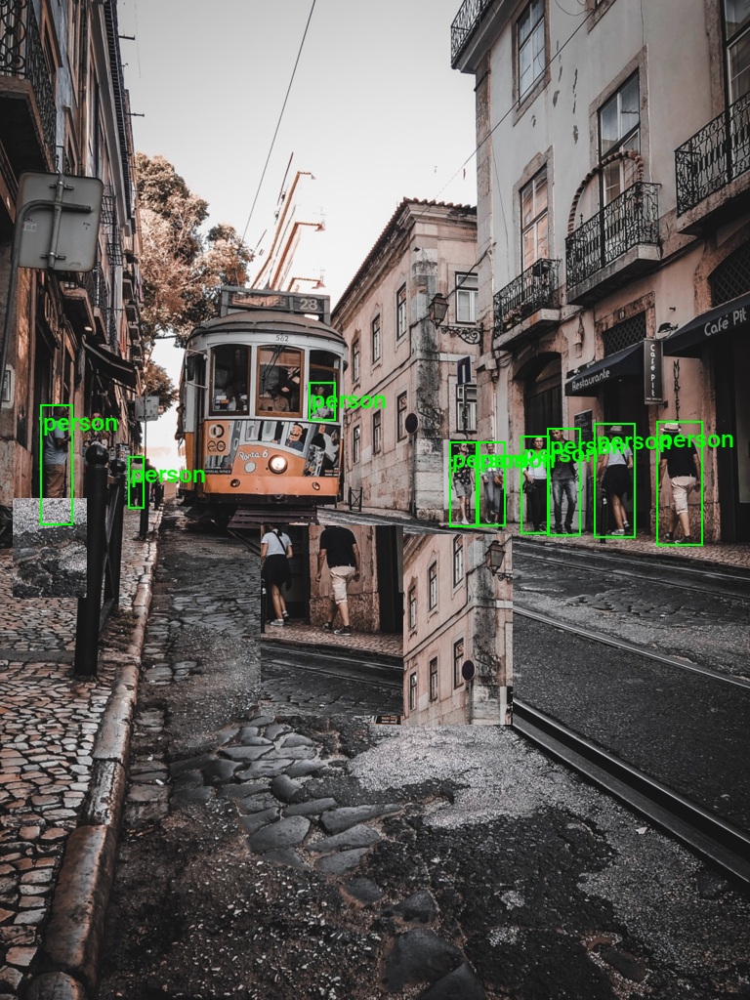

In [24]:
# Feed sample image and targets through the image transform
augmented_img, augmented_targets = rand_patch_copy_tfm(transforms.PILToTensor()(sample_img), targets)
# Remove degenerate/invalid bounding boxes and their corresponding labels and masks.
sanitized_img, sanitized_targets = transforms.SanitizeBoundingBoxes()(augmented_img, augmented_targets)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=sanitized_img, 
    boxes=sanitized_targets['boxes'], 
    labels=[class_names[int(label.item())] for label in sanitized_targets['labels']], 
    colors=[int_colors[int(i)] for i in sanitized_targets['labels']]
)

# Display the augmented image
tensor_to_pil(annotated_tensor)

#### tv_tensor.Image

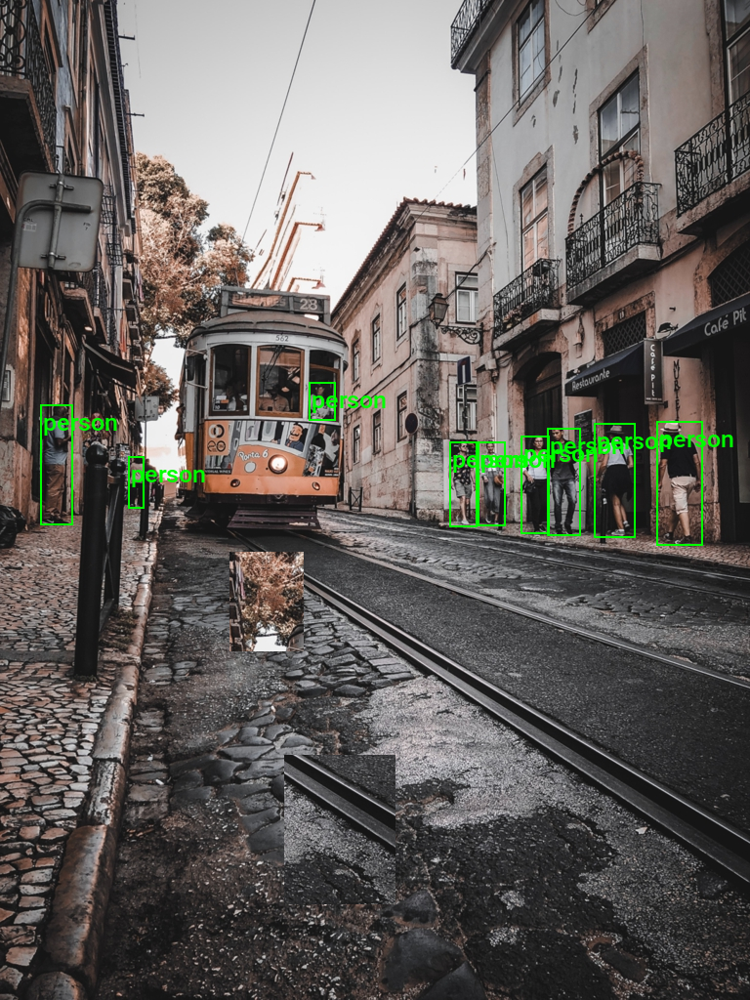

In [25]:
# Feed sample image and targets through the image transform
augmented_img, augmented_targets = rand_patch_copy_tfm(transforms.ToImage()(sample_img), targets)
# Remove degenerate/invalid bounding boxes and their corresponding labels and masks.
sanitized_img, sanitized_targets = transforms.SanitizeBoundingBoxes()(augmented_img, augmented_targets)

# Annotate the augmented image with updated labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=sanitized_img, 
    boxes=sanitized_targets['boxes'], 
    labels=[class_names[int(label.item())] for label in sanitized_targets['labels']], 
    colors=[int_colors[int(i)] for i in sanitized_targets['labels']]
)

# Display the augmented image
tensor_to_pil(annotated_tensor)